In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.special import erf
import csv
import sys
sys.path.append('/storage/home/hcoda1/4/ashelby8/Manitoba/pyNab/src/')
import nabPy as Nab
sys.path.append('/storage/home/hcoda1/4/ashelby8/calibration/calibration/')
from FitClass import SnCalibration
from FitClass import CdCalibration
from config import conf
import FitFuncs
import pandas as pd
import pylab as py
np.set_printoptions(threshold=sys.maxsize)
pd.set_option("display.max_colwidth", 15)
from scipy.stats import chisquare

In [2]:
def wave_fit(wave, func, pretrig=2000,p0=None):
    xdata = np.arange(0,len(wave))
    prewave = wave[0:int(pretrig)]
    base = np.average(prewave)
    ydata = wave - base
    if p0 == None:
        popt, pcov = curve_fit(func, xdata[3300:3700], ydata[3300:3700],maxfev=4000)
        chi2 = sum((ydata.compute()-wave_func(xdata,*popt))**2/wave_func(xdata,*popt))/len(wave_func(xdata,*popt))
    else:
        try:
            
            if type(ydata)==np.ndarray:
                popt, pcov = curve_fit(func, xdata, ydata, p0)
                
                chi2 = sum((ydata-wave_func(xdata,*popt))**2)/len(wave_func(xdata,*popt))              
            else:

                popt, pcov = curve_fit(func, xdata[2500:4500], ydata[2500:4500], p0)
                chi2 = sum((ydata[3400:3625].compute()-wave_func(xdata[3400:3625],*popt))**2)/(len(xdata[3400:3625])-len(popt))

        except Exception as e:
            return 0,0,0
    
    return func(xdata, *popt) + base, popt, chi2

def wave_func(x, a,b,c,d,e,f):
    return a + b*x + c*x**2.0 + d*np.exp(-(x-e)/1250.0) / (1.0 + np.exp(-(x-e)/f))

def risetime(wave,fit_mid,low=0.1, high=0.9,pretrigger=[0,1000], cut=0,max_delay=0, max_length=50):
    try:
        shift = np.mean(wave[pretrigger[0]:pretrigger[1]])
        wave = wave - shift
        if max_delay == 0:
            maxval = np.max(wave[int(fit_mid)-15:int(fit_mid)+15])
        else:
            maxval = np.mean(wave[3550+max_delay:3550+max_delay+max_length])

        wave = wave[cut:]
        xs = np.arange(len(wave))*4
        upperCross = maxval * high
        lowerCross = maxval * low
#         print(upperCross)
#         print(lowerCross)
        x = np.arange(0,5900)
        upCrossPoint = np.argwhere(wave[int(fit_mid):]>upperCross)[0][0]+int(fit_mid)
        lowCrossPoint = np.argwhere(wave[:int(fit_mid)]<lowerCross)[-1][0]+1
#         print(upCrossPoint)
#         print(lowCrossPoint)
        
        
        upper = np.interp(upperCross, wave[upCrossPoint-1:upCrossPoint+1], xs[upCrossPoint-1:upCrossPoint+1])
        lower = np.interp(lowerCross, wave[lowCrossPoint-1:lowCrossPoint+1], xs[lowCrossPoint-1:lowCrossPoint+1])
        
#         print(upper)
#         print(lower)
        
        return upper-lower, [lower/4+cut, upper/4+cut, maxval+shift]
    
    except Exception as e:
        plt.plot(wave,label = 'exception wave')
        plt.legend()
        plt.show()
        print(e)
        return 0,[0,0,0]

In [3]:
x = np.arange(0,5000)
print(sum(x-5))

12472500


In [4]:
%%time

runNumber = 1828
directory = '/storage/home/hcoda1/4/ashelby8/scratch/ManitobaData/03-16-2022_30KeV_Proton_Bias_Scan_Cd109/-320V/'
run = Nab.DataRun(directory, runNumber, ignoreEventFile = False)

CPU times: user 676 ms, sys: 1.14 s, total: 1.81 s
Wall time: 39.9 s


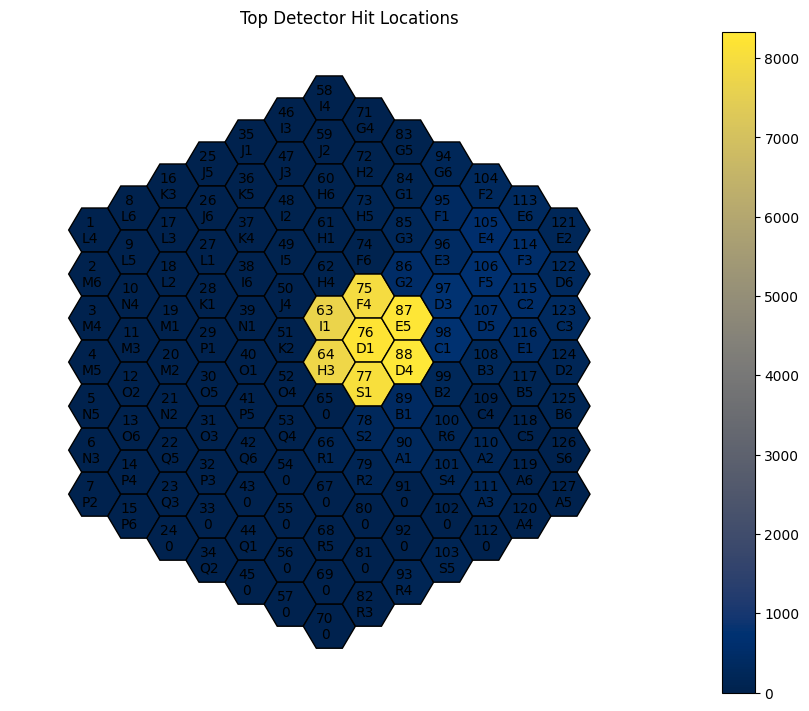

In [5]:
np.argwhere(run.plotHitLocations(sourceFile = 'singles',plot = False,det = 'top')==max(run.plotHitLocations(sourceFile = 'singles',plot = False,det = 'top')))
# run.plotHitLocations(sourceFile = 'singles',plot = False,det = 'top')
run.plotHitLocations(sourceFile = 'singles',plot = True,det = 'top')

In [9]:
run.singleWaves().resetCuts()
print(len(run.singleWaves().waves()))
# run.singleWaves().defineCut('pixel', '=', 76)

67811


In [10]:
# run.singleWaves().resetCuts()
# run.singleWaves().defineCut('pixel', '=', 76)
# # results.resetCuts()
# results = run.singleWaves().determineEnergyTiming(method='trap', params=[200, 50, 1250])
# bins = np.arange(20,50)
# plt.hist(results.data()['energy'],bins = bins)

# plt.axvline(20,color = 'C1',label = '1st')
# plt.axvline(50,color = 'C1')


# plt.axvline(36,color = 'C2',label = '2nd')
# plt.axvline(38,color = 'C2')

# plt.legend()
# plt.show()

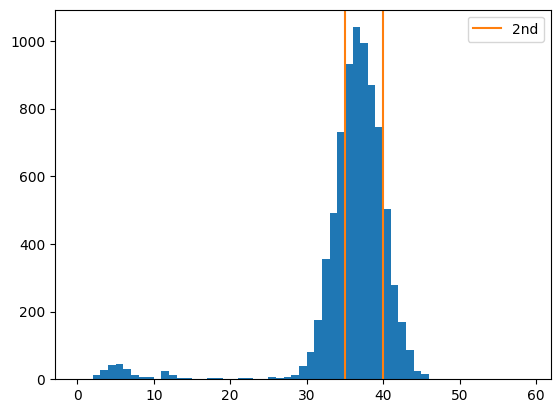

In [8]:
run.singleWaves().resetCuts()
run.singleWaves().defineCut('pixel', '=', 76)
# results.resetCuts()
results = run.singleWaves().determineEnergyTiming(method='trap', params=[1250, 50, 1250])
bins = np.arange(0,60)
plt.hist(results.data()['energy'],bins = bins)

# plt.axvline(20,color = 'C1',label = '1st')
# plt.axvline(50,color = 'C1')


plt.axvline(35,color = 'C1',label = '2nd')
plt.axvline(40,color = 'C1')

plt.legend()
plt.show()

67811
8205
4580


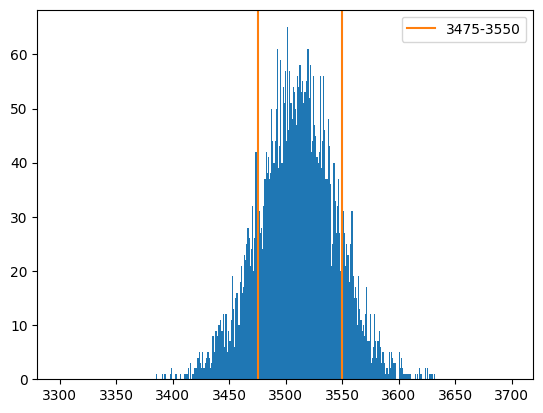

3318


In [9]:
run.singleWaves().resetCuts()
print(len(run.singleWaves().waves()))
run.singleWaves().defineCut('pixel', '=', 76)

results.resetCuts()
print(len(run.singleWaves().waves()))

results.defineCut('energy', 'between',35,40)
cut = results.returnCut()
run.singleWaves().defineCut('custom', cut)
waves = run.singleWaves().waves()
print(len(waves))

bins = np.arange(3300,3700)
plt.hist(results.data()['t0'],bins = bins)
plt.axvline(3475,color = 'C1',label = '3475-3550')
plt.axvline(3550,color = 'C1')

plt.legend()
plt.show()


results.defineCut('t0', 'between', 3475,3550)
cut = results.returnCut()
run.singleWaves().defineCut('custom', cut)
waves = run.singleWaves().waves()
print(len(waves))

67811
8205
3836


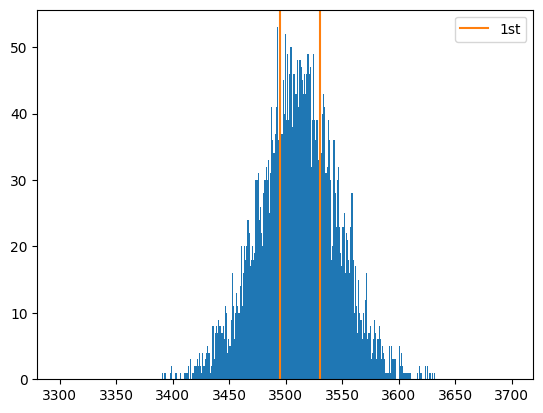

In [14]:
run.singleWaves().resetCuts()
print(len(run.singleWaves().waves()))
run.singleWaves().defineCut('pixel', '=', 76)

results.resetCuts()
print(len(run.singleWaves().waves()))

results.defineCut('energy', 'between',35,40)
cut = results.returnCut()
run.singleWaves().defineCut('custom', cut)
waves = run.singleWaves().waves()
print(len(waves))

bins = np.arange(3300,3700,1)
plt.hist(results.data()['t0'],bins = bins)
# print(len(results.data()['t0']))

plt.axvline(3495,color = 'C1',label = '1st')
plt.axvline(3530,color = 'C1')

plt.legend()
plt.show()


# results.defineCut('t0', 'between',3495,3500)
# cut = results.returnCut()
# run.singleWaves().defineCut('custom', cut)
# waves = run.singleWaves().waves()
# print(run.singleWaves().waves())
# print(len(results.data()['t0']))


# nrows,ncols=40,4
# py.figure(figsize=(10*ncols,8*nrows))
# cnt = 0

# x = np.arange(0,7000)
# for i in range(100):
#     cnt+=1
#     ax=py.subplot(nrows,ncols,cnt)
#     ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
#     ax.plot(x[3200:3800],waves[i][3200:3800],label='energy = %.2f'%round(results.data()['energy'].iloc[i], 2))
# #     print(run.singleWaves().iloc[0])
# #     print(results.data()['t0'].iloc[i])
# #     print(type(results.data()['t0']))
    
#     ax.axvline(results.data()['t0'].iloc[i], color = 'C1')
#     ax.legend(fontsize=20)

In [11]:
run.singleWaves().resetCuts()
print(len(run.singleWaves().waves()))
run.singleWaves().defineCut('pixel', '=', 76)

results.resetCuts()
print(len(run.singleWaves().waves()))

results.defineCut('energy', 'between',20,50)
cut = results.returnCut()
run.singleWaves().defineCut('custom', cut)
waves = run.singleWaves().waves()
print(len(waves))

results.defineCut('t0', 'between',3475,3550)
cut = results.returnCut()
run.singleWaves().defineCut('custom', cut)
waves = run.singleWaves().waves()
print(len(waves))

nrows,ncols=40,4
py.figure(figsize=(10*ncols,8*nrows))
cnt = 2

before = 0
after = 0
num = 0
for i in range(500):
    ydata = waves[i]
    func, par, chi2 = wave_fit(waves[i],wave_func,p0=[5,5e-3,1e-7,50,3500,1])
    var1 = sum((ydata[:1500].compute() - np.mean(ydata[:1500].compute()))**2)/len(ydata[:1500].compute())
    var6 = sum((ydata[3825:].compute() - np.mean(ydata[3825:].compute()))**2)/len(ydata[3825:].compute())
#     var4 = sum((ydata[4000:].compute() - np.mean(ydata[4000:].compute()))**2)/len(ydata[4000:].compute())
    
    var7 = sum((ydata[4200:4400].compute() - np.mean(ydata[4200:4400].compute()))**2)/len(ydata[4200:4400].compute())
    var8 = sum((ydata[3825:4025].compute() - np.mean(ydata[3825:4025].compute()))**2)/len(ydata[3825:4025].compute())
    var9 = sum((ydata[5000:5200].compute() - np.mean(ydata[5000:5200].compute()))**2)/len(ydata[5000:5200].compute())
    
    var10 = sum((ydata[1500:2500].compute() - np.mean(ydata[1500:2500].compute()))**2)/len(ydata[1500:2500].compute())
    var11 = sum((ydata[2000:3400].compute() - np.mean(ydata[2000:3400].compute()))**2)/len(ydata[2000:3400].compute())
    var12 = sum((ydata[500:700].compute() - np.mean(ydata[500:700].compute()))**2)/len(ydata[500:700].compute())

    var2 = sum((ydata[int(par[4])+7:int(par[4])+200].compute() - np.mean(ydata[int(par[4])+7:int(par[4])+200].compute()))**2)/len(ydata[int(par[4])+7:int(par[4])+200].compute())
    var3 = sum((ydata[int(par[4])-200:int(par[4])-7].compute() - np.mean(ydata[int(par[4])-200:int(par[4])-7].compute()))**2)/len(ydata[int(par[4])-200:int(par[4])-7].compute())
    
    var4 = sum((ydata[int(par[4])-1000:int(par[4])-100].compute() - np.mean(ydata[int(par[4])-1000:int(par[4])-100].compute()))**2)/len(ydata[int(par[4])-1000:int(par[4])-100].compute())
    var5 = sum((ydata[int(par[4])+100:int(par[4])+1000].compute() - np.mean(ydata[int(par[4])+100:int(par[4])+1000].compute()))**2)/len(ydata[int(par[4])+100:int(par[4])+1000].compute())
    
    if type(par)==int:
#         cnt+=1
#         ax=py.subplot(nrows,ncols,cnt)
#         ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
#         ax.plot(waves[i],label = 'not fit:var=%.2f,%.2f'%(var1,var2))
#         ax.set_xlim(3200,3800)
#         ax.set_ylim(-160,-40)
#         ax.legend(fontsize=20)
        pass
    
    elif (np.abs(par[5])/par[5] != np.abs(par[3])/par[3]):
#         cnt+=1
#         ax=py.subplot(nrows,ncols,cnt)
#         ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
#         ax.plot(waves[i],color = 'red')
#         ax.plot(func,label = '%.2f:pass:%.2f:var=%.2f,%.2f,\n%.2f,%.2f,\n%.2f,%.2f\n%.2f,%.2f,%.2f,%.2f'%(par[5],chi2,var1,var2,var3,var4,var5,var6,var7,var8,var9,var10))
#         ax.set_xlim(3200,3800)
#         ax.set_ylim(-160,-40)
#         ax.legend(fontsize=20)
        pass
        
        
    elif np.abs(par[5])/par[5] == np.abs(par[3])/par[3] and np.abs(var10)<90 and np.abs(var12)<90 and np.abs(var7)<90 and np.abs(var9)<90:
#     and np.abs(var10)<100 and np.abs(var9)<100 and np.abs(var11)<100 and np.abs(var7)<100 and np.abs(var4)<90 and np.abs(var8)<95:
#     and np.abs(var2)<70 and np.abs(var3)<70 and np.abs(var1)<120:
#         and np.abs(var2)<75 and np.abs(var3)<75 and np.abs(var1)<110
#         and np.abs(var1)<100 and np.abs(par[5])<19 and np.abs(var1)<200 and np.abs(var2)<200
        cnt+=1
        ax=py.subplot(nrows,ncols,cnt)
        ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
        ax.plot(waves[i])
        ax.plot(func,label = '%.2f:accepted:%.2fvar=%.2f,%.2f,\n%.2f,%.2f,\n%.2f,%.2f\n%.2f,%.2f,%.2f,%.2f\n%.2f,%.2f'%(par[5],chi2,var1,var2,var3,var4,var5,var6,var7,var8,var9,var10,var11,var12))
        ax.set_xlim(3200,3800)
        ax.set_ylim(-160,-40)
        ax.legend(fontsize=20)
        
        cnt+=1
        ax=py.subplot(nrows,ncols,cnt)
        ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
        ax.plot(waves[i])
        ax.set_xlim(0,3400)
        ax.set_ylim(-160,-40)
        
        cnt+=1
        ax=py.subplot(nrows,ncols,cnt)
        ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
        ax.plot(waves[i])
        ax.set_xlim(left = 3600)
        ax.set_ylim(-160,-40)
        
#         ax.axvline(par[4]-7)
#         ax.axvline(par[4]-300)
#         ax.axvline(par[4]+5)
#         ax.axvline(par[4]+300)
#         print(par)
        num +=1
        start = int(par[4])-2900
        end = int(par[4]) + 3000

        before += waves[i][start:int(par[4])].compute()
        after += waves[i][int(par[4]):end].compute()
#         if i%10==0:
        ax=py.subplot(nrows,ncols,1)
        ax.tick_params(direction='in',which='both',axis='both',labelsize=15)
        ax.plot(np.concatenate((before,after))/num)
        
        
        

ax=py.subplot(nrows,ncols,2)
ax.plot(np.concatenate((before,after))/num)
# ax.set_xlim(2850,2950)
av_waves11 = np.concatenate((before,after))/num
func1, par1,chi2 = wave_fit(av_waves11,wave_func,p0=[-5,5e-7,1e-10,20,3500,1])
rise, vals = risetime(av_waves11, par1[4],low=0.1, high=0.9)
ax.plot(func1,label = '%.2f'%rise)
ax.legend(fontsize=20)
plt.show()

67811
8205
7574
5425


TypeError: 'int' object is not subscriptable

<Figure size 4000x32000 with 0 Axes>

In [ ]:
# x = np.arange(0,len(waves[9]))
# prewave = waves[9][0:2900]
# base = np.average(prewave)
# y = waves[9] - base
# plt.plot(x[3200:3800],y[3200:3800])
# p0 = [-5,5e-7,1e-10,50,3500,2]
# popt, pcov,info,mes,ier = curve_fit(wave_func, x[2000:4000], y[2000:4000], p0=p0, full_output=True)
# plt.plot(x[3200:3800],wave_func(x[3200:3800],*popt))

In [ ]:
# run.singleWaves().resetCuts()
# print(len(run.singleWaves().waves()))
# run.singleWaves().defineCut('pixel', '=', 76)

# results.resetCuts()
# print(len(run.singleWaves().waves()))

# results.defineCut('energy', 'between',20,50)
# cut = results.returnCut()
# run.singleWaves().defineCut('custom', cut)
# waves = run.singleWaves().waves()
# print(len(waves))

# results.defineCut('t0', 'between',3475,3550)
# cut = results.returnCut()
# run.singleWaves().defineCut('custom', cut)
# waves = run.singleWaves().waves()
# print(len(waves))

# nrows,ncols=40,4
# py.figure(figsize=(10*ncols,8*nrows))
# cnt = 2

# before = 0
# after = 0
# num = 0
# for i in range(800):
#     ydata = waves[i]
#     func, par, chi2 = wave_fit(waves[i],wave_func,p0=[5,5e-3,1e-7,50,3500,1])
    
#     var1 = sum((ydata[:1500].compute() - np.mean(ydata[:1500].compute()))**2)/len(ydata[:1500].compute())
#     var6 = sum((ydata[3825:].compute() - np.mean(ydata[3825:].compute()))**2)/len(ydata[3825:].compute())
# #     var4 = sum((ydata[4000:].compute() - np.mean(ydata[4000:].compute()))**2)/len(ydata[4000:].compute())
    
#     var7 = sum((ydata[4200:4400].compute() - np.mean(ydata[4200:4400].compute()))**2)/len(ydata[4200:4400].compute())
#     var8 = sum((ydata[3825:4025].compute() - np.mean(ydata[3825:4025].compute()))**2)/len(ydata[3825:4025].compute())
#     var9 = sum((ydata[5000:5200].compute() - np.mean(ydata[5000:5200].compute()))**2)/len(ydata[5000:5200].compute())
    
#     var10 = sum((ydata[1500:2500].compute() - np.mean(ydata[1500:2500].compute()))**2)/len(ydata[1500:2500].compute())
#     var11 = sum((ydata[2000:3400].compute() - np.mean(ydata[2000:3400].compute()))**2)/len(ydata[2000:3400].compute())
#     var12 = sum((ydata[500:700].compute() - np.mean(ydata[500:700].compute()))**2)/len(ydata[500:700].compute())

#     var2 = sum((ydata[int(par[4])+7:int(par[4])+200].compute() - np.mean(ydata[int(par[4])+7:int(par[4])+200].compute()))**2)/len(ydata[int(par[4])+7:int(par[4])+200].compute())
#     var3 = sum((ydata[int(par[4])-200:int(par[4])-7].compute() - np.mean(ydata[int(par[4])-200:int(par[4])-7].compute()))**2)/len(ydata[int(par[4])-200:int(par[4])-7].compute())
    
#     var4 = sum((ydata[int(par[4])-1000:int(par[4])-100].compute() - np.mean(ydata[int(par[4])-1000:int(par[4])-100].compute()))**2)/len(ydata[int(par[4])-1000:int(par[4])-100].compute())
#     var5 = sum((ydata[int(par[4])+100:int(par[4])+1000].compute() - np.mean(ydata[int(par[4])+100:int(par[4])+1000].compute()))**2)/len(ydata[int(par[4])+100:int(par[4])+1000].compute())
    
#     if type(par)==int:
# #         cnt+=1
# #         ax=py.subplot(nrows,ncols,cnt)
# #         ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
# #         ax.plot(waves[i],label = 'not fit:var=%.2f,%.2f'%(var1,var2))
# #         ax.set_xlim(3200,3800)
# #         ax.set_ylim(-160,-40)
# #         ax.legend(fontsize=20)
#         pass
    
#     elif (np.abs(par[5])/par[5] != np.abs(par[3])/par[3]):
# #         cnt+=1
# #         ax=py.subplot(nrows,ncols,cnt)
# #         ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
# #         ax.plot(waves[i],color = 'red')
# #         ax.plot(func,label = '%.2f:pass:%.2f:var=%.2f,%.2f,\n%.2f,%.2f,\n%.2f,%.2f\n%.2f,%.2f,%.2f,%.2f'%(par[5],chi2,var1,var2,var3,var4,var5,var6,var7,var8,var9,var10))
# #         ax.set_xlim(3200,3800)
# #         ax.set_ylim(-160,-40)
# #         ax.legend(fontsize=20)
#         pass
        
        
#     elif np.abs(par[5])/par[5] == np.abs(par[3])/par[3] and np.abs(var2)<70 and np.abs(var3)<70 and np.abs(var4)<100:
# #     and np.abs(var10)<100 and np.abs(var9)<100 and np.abs(var11)<100 and np.abs(var7)<100 and np.abs(var4)<90 and np.abs(var8)<95:
# #     and np.abs(var2)<70 and np.abs(var3)<70 and np.abs(var1)<120:
# #         and np.abs(var2)<75 and np.abs(var3)<75 and np.abs(var1)<110
# #         and np.abs(var1)<100 and np.abs(par[5])<19 and np.abs(var1)<200 and np.abs(var2)<200
#         cnt+=1
#         ax=py.subplot(nrows,ncols,cnt)
#         ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
#         ax.plot(waves[i])
#         ax.plot(func,label = '%.2f:accepted:%.2fvar=%.2f,%.2f,\n%.2f,%.2f,\n%.2f,%.2f\n%.2f,%.2f,%.2f,%.2f\n%.2f,%.2f'%(par[5],chi2,var1,var2,var3,var4,var5,var6,var7,var8,var9,var10,var11,var12))
#         ax.set_xlim(3200,3800)
#         ax.set_ylim(-160,-40)
#         ax.legend(fontsize=20)
        
#         cnt+=1
#         ax=py.subplot(nrows,ncols,cnt)
#         ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
#         ax.plot(waves[i])
#         ax.set_xlim(0,3400)
#         ax.set_ylim(-160,-40)
        
#         cnt+=1
#         ax=py.subplot(nrows,ncols,cnt)
#         ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
#         ax.plot(waves[i])
#         ax.set_xlim(left = 3600)
#         ax.set_ylim(-160,-40)
        
# #         ax.axvline(par[4]-7)
# #         ax.axvline(par[4]-300)
# #         ax.axvline(par[4]+5)
# #         ax.axvline(par[4]+300)
# #         print(par)
#         num +=1
#         start = int(par[4])-2900
#         end = int(par[4]) + 3000

#         before += waves[i][start:int(par[4])].compute()
#         after += waves[i][int(par[4]):end].compute()
# #         if i%10==0:
#         ax=py.subplot(nrows,ncols,1)
#         ax.tick_params(direction='in',which='both',axis='both',labelsize=15)
#         ax.plot(np.concatenate((before,after))/num)
        
        
        

# ax=py.subplot(nrows,ncols,2)
# ax.plot(np.concatenate((before,after))/num)
# # ax.set_xlim(2850,2950)
# av_waves11 = np.concatenate((before,after))/num
# func1, par1,chi2 = wave_fit(av_waves11,wave_func,p0=[-5,5e-7,1e-10,20,3500,1])
# rise, vals = risetime(av_waves11, par1[4],low=0.1, high=0.9)
# ax.plot(func1,label = '%.2f'%rise)
# ax.legend(fontsize=20)
# plt.show()

In [ ]:
# run.singleWaves().resetCuts()
# print(len(run.singleWaves().waves()))
# run.singleWaves().defineCut('pixel', '=', 76)

# results.resetCuts()
# print(len(run.singleWaves().waves()))

# results.defineCut('energy', 'between',20,50)
# cut = results.returnCut()
# run.singleWaves().defineCut('custom', cut)
# waves = run.singleWaves().waves()
# print(len(waves))

# results.defineCut('t0', 'between',3475,3550)
# cut = results.returnCut()
# run.singleWaves().defineCut('custom', cut)
# waves = run.singleWaves().waves()
# print(len(waves))

# nrows,ncols=40,4
# py.figure(figsize=(10*ncols,8*nrows))
# cnt = 2

# before = 0
# after = 0
# num = 0
# for i in range(800):
#     ydata = waves[i]
#     func, par, chi2 = wave_fit(waves[i],wave_func,p0=[5,5e-3,1e-7,50,3500,1])
    
#     var1 = sum((ydata[:1500].compute() - np.mean(ydata[:1500].compute()))**2)/len(ydata[:1500].compute())
#     var6 = sum((ydata[3825:].compute() - np.mean(ydata[3825:].compute()))**2)/len(ydata[3825:].compute())
# #     var4 = sum((ydata[4000:].compute() - np.mean(ydata[4000:].compute()))**2)/len(ydata[4000:].compute())
    
#     var7 = sum((ydata[4200:4400].compute() - np.mean(ydata[4200:4400].compute()))**2)/len(ydata[4200:4400].compute())
#     var8 = sum((ydata[3825:4025].compute() - np.mean(ydata[3825:4025].compute()))**2)/len(ydata[3825:4025].compute())
#     var9 = sum((ydata[5000:5200].compute() - np.mean(ydata[5000:5200].compute()))**2)/len(ydata[5000:5200].compute())
    
#     var10 = sum((ydata[1500:2500].compute() - np.mean(ydata[1500:2500].compute()))**2)/len(ydata[1500:2500].compute())
#     var11 = sum((ydata[2000:3400].compute() - np.mean(ydata[2000:3400].compute()))**2)/len(ydata[2000:3400].compute())
#     var12 = sum((ydata[500:700].compute() - np.mean(ydata[500:700].compute()))**2)/len(ydata[500:700].compute())
    
#     var2 = sum((ydata[int(par[4])+7:int(par[4])+200].compute() - np.mean(ydata[int(par[4])+7:int(par[4])+200].compute()))**2)/len(ydata[int(par[4])+7:int(par[4])+200].compute())
#     var3 = sum((ydata[int(par[4])-200:int(par[4])-7].compute() - np.mean(ydata[int(par[4])-200:int(par[4])-7].compute()))**2)/len(ydata[int(par[4])-200:int(par[4])-7].compute())
    
#     var4 = sum((ydata[int(par[4])-1000:int(par[4])-100].compute() - np.mean(ydata[int(par[4])-1000:int(par[4])-100].compute()))**2)/len(ydata[int(par[4])-1000:int(par[4])-100].compute())
#     var5 = sum((ydata[int(par[4])+100:int(par[4])+1000].compute() - np.mean(ydata[int(par[4])+100:int(par[4])+1000].compute()))**2)/len(ydata[int(par[4])+100:int(par[4])+1000].compute())
    
#     if type(par)==int:
# #         cnt+=1
# #         ax=py.subplot(nrows,ncols,cnt)
# #         ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
# #         ax.plot(waves[i],label = 'not fit:var=%.2f,%.2f'%(var1,var2))
# #         ax.set_xlim(3200,3800)
# #         ax.set_ylim(-160,-40)
# #         ax.legend(fontsize=20)
#         pass
    
#     elif (np.abs(par[5])/par[5] != np.abs(par[3])/par[3]):
# #         cnt+=1
# #         ax=py.subplot(nrows,ncols,cnt)
# #         ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
# #         ax.plot(waves[i],color = 'red')
# #         ax.plot(func,label = '%.2f:pass:%.2f:var=%.2f,%.2f,\n%.2f,%.2f,\n%.2f,%.2f\n%.2f,%.2f,%.2f,%.2f'%(par[5],chi2,var1,var2,var3,var4,var5,var6,var7,var8,var9,var10))
# #         ax.set_xlim(3200,3800)
# #         ax.set_ylim(-160,-40)
# #         ax.legend(fontsize=20)
#         pass
        
        
#     elif np.abs(par[5])/par[5] == np.abs(par[3])/par[3] and np.abs(var2)<70 and np.abs(var3)<70 and np.abs(var4)<100:
# #     and np.abs(var10)<100 and np.abs(var9)<100 and np.abs(var11)<100 and np.abs(var7)<100 and np.abs(var4)<90 and np.abs(var8)<95:
# #     and np.abs(var2)<70 and np.abs(var3)<70 and np.abs(var1)<120:
# #         and np.abs(var2)<75 and np.abs(var3)<75 and np.abs(var1)<110
# #         and np.abs(var1)<100 and np.abs(par[5])<19 and np.abs(var1)<200 and np.abs(var2)<200
#         cnt+=1
#         ax=py.subplot(nrows,ncols,cnt)
#         ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
#         ax.plot(waves[i])
#         ax.plot(func,label = '%.2f:accepted:%.2fvar=%.2f,%.2f,\n%.2f,%.2f,\n%.2f,%.2f\n%.2f,%.2f,%.2f,%.2f\n%.2f,%.2f'%(par[5],chi2,var1,var2,var3,var4,var5,var6,var7,var8,var9,var10,var11,var12))
#         ax.set_xlim(3200,3800)
#         ax.set_ylim(-160,-40)
#         ax.legend(fontsize=20)
        
#         cnt+=1
#         ax=py.subplot(nrows,ncols,cnt)
#         ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
#         ax.plot(waves[i])
#         ax.set_xlim(0,3400)
#         ax.set_ylim(-160,-40)
        
#         cnt+=1
#         ax=py.subplot(nrows,ncols,cnt)
#         ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
#         ax.plot(waves[i])
#         ax.set_xlim(left = 3600)
#         ax.set_ylim(-160,-40)
        
# #         ax.axvline(par[4]-7)
# #         ax.axvline(par[4]-300)
# #         ax.axvline(par[4]+5)
# #         ax.axvline(par[4]+300)
# #         print(par)
#         num +=1
#         start = int(par[4])-2900
#         end = int(par[4]) + 3000

#         before += waves[i][start:int(par[4])].compute()
#         after += waves[i][int(par[4]):end].compute()
# #         if i%10==0:
#         ax=py.subplot(nrows,ncols,1)
#         ax.tick_params(direction='in',which='both',axis='both',labelsize=15)
#         ax.plot(np.concatenate((before,after))/num)
        
        
        

# ax=py.subplot(nrows,ncols,2)
# ax.plot(np.concatenate((before,after))/num)
# # ax.set_xlim(2850,2950)
# av_waves11 = np.concatenate((before,after))/num
# func1, par1,chi2 = wave_fit(av_waves11,wave_func,p0=[-5,5e-7,1e-10,20,3500,1])
# rise, vals = risetime(av_waves11, par1[4],low=0.1, high=0.9)
# ax.plot(func1,label = '%.2f'%rise)
# ax.legend(fontsize=20)
# plt.show()

In [36]:
run.singleWaves().resetCuts()
print(len(run.singleWaves().waves()))
run.singleWaves().defineCut('pixel', '=', 76)

results.resetCuts()
print(len(run.singleWaves().waves()))

results.defineCut('energy', 'between',35,40)
cut = results.returnCut()
run.singleWaves().defineCut('custom', cut)
waves = run.singleWaves().waves()
print(len(waves))

# results.defineCut('t0', 'between',3475,3550)
# cut = results.returnCut()
# run.singleWaves().defineCut('custom', cut)
# waves = run.singleWaves().waves()
# print(len(waves))


nrows,ncols=40,4
py.figure(figsize=(10*ncols,8*nrows))
cnt = 2

before = 0
after = 0
num = 0
for i in range(100):
    ydata = waves[i]
    func, par, chi2 = wave_fit(waves[i],wave_func,p0=[5,5e-3,1e-7,50,3500,0.7])
    
    var1 = sum((ydata[:1500].compute() - np.mean(ydata[:1500].compute()))**2)/len(ydata[:1500].compute())
    var6 = sum((ydata[3825:].compute() - np.mean(ydata[3825:].compute()))**2)/len(ydata[3825:].compute())
#     var4 = sum((ydata[4000:].compute() - np.mean(ydata[4000:].compute()))**2)/len(ydata[4000:].compute())
    
    var7 = sum((ydata[4200:4400].compute() - np.mean(ydata[4200:4400].compute()))**2)/len(ydata[4200:4400].compute())
    var8 = sum((ydata[3825:4025].compute() - np.mean(ydata[3825:4025].compute()))**2)/len(ydata[3825:4025].compute())
    var9 = sum((ydata[5000:5200].compute() - np.mean(ydata[5000:5200].compute()))**2)/len(ydata[5000:5200].compute())
    var10 = sum((ydata[1500:2500].compute() - np.mean(ydata[1500:2500].compute()))**2)/len(ydata[1500:2500].compute())
    var11 = sum((ydata[2000:3400].compute() - np.mean(ydata[2000:3400].compute()))**2)/len(ydata[2000:3400].compute())
    var12 = sum((ydata[500:700].compute() - np.mean(ydata[500:700].compute()))**2)/len(ydata[500:700].compute())

    
    if type(par)==int:
#         cnt+=1
#         ax=py.subplot(nrows,ncols,cnt)
#         ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
#         ax.plot(waves[i],label = 'not fit:var=%.2f,%.2f'%(var1,var2))
#         ax.set_xlim(3200,3800)
#         ax.set_ylim(-160,-40)
#         ax.legend(fontsize=20)
        pass
    
    elif (np.abs(par[5])/par[5] != np.abs(par[3])/par[3]):
#         cnt+=1
#         ax=py.subplot(nrows,ncols,cnt)
#         ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
#         ax.plot(waves[i],color = 'red')
#         ax.plot(func,label = '%.2f:pass:%.2f:var=%.2f,%.2f,\n%.2f,%.2f,\n%.2f,%.2f\n%.2f,%.2f,%.2f,%.2f'%(par[5],chi2,var1,var2,var3,var4,var5,var6,var7,var8,var9,var10))
#         ax.set_xlim(3200,3800)
#         ax.set_ylim(-160,-40)
#         ax.legend(fontsize=20)
        pass
        
        
    elif np.abs(par[5])/par[5] == np.abs(par[3])/par[3]:
#     and np.abs(var10)<100 and np.abs(var9)<100 and np.abs(var11)<100 and np.abs(var7)<100 and np.abs(var4)<90 and np.abs(var8)<95:
#     and np.abs(var2)<70 and np.abs(var3)<70 and np.abs(var1)<120:
#         and np.abs(var2)<75 and np.abs(var3)<75 and np.abs(var1)<110
#         and np.abs(var1)<100 and np.abs(par[5])<19 and np.abs(var1)<200 and np.abs(var2)<200
        var2 = sum((ydata[int(par[4])+7:int(par[4])+200].compute() - np.mean(ydata[int(par[4])+7:int(par[4])+200].compute()))**2)/len(ydata[int(par[4])+7:int(par[4])+200].compute())
        var3 = sum((ydata[int(par[4])-200:int(par[4])-7].compute() - np.mean(ydata[int(par[4])-200:int(par[4])-7].compute()))**2)/len(ydata[int(par[4])-200:int(par[4])-7].compute())
        var4 = sum((ydata[int(par[4])-1000:int(par[4])-100].compute() - np.mean(ydata[int(par[4])-1000:int(par[4])-100].compute()))**2)/len(ydata[int(par[4])-1000:int(par[4])-100].compute())
        var5 = sum((ydata[int(par[4])+100:int(par[4])+1000].compute() - np.mean(ydata[int(par[4])+100:int(par[4])+1000].compute()))**2)/len(ydata[int(par[4])+100:int(par[4])+1000].compute())
#         if np.abs(var3)<65 and np.abs(var2)<75:
            
        
        cnt+=1
        ax=py.subplot(nrows,ncols,cnt)
        ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
        ax.plot(waves[i])
        ax.plot(func,label = '%.2f:accepted:%.2fvar=%.2f,%.2f,\n%.2f,%.2f,\n%.2f,%.2f\n%.2f,%.2f,%.2f,%.2f\n%.2f,%.2f'%(par[5],chi2,var1,var2,var3,var4,var5,var6,var7,var8,var9,var10,var11,var12))
        ax.set_xlim(3200,3800)
        ax.set_ylim(-160,-40)
        ax.axvline(par[4]+1000,color = 'C2')
        ax.axvline(par[4]-1000,color = 'C2')

#             ax.axvline(par[4]+7,color = 'C3')
#             ax.axvline(par[4]-7,color = 'C3')

        ax.axvline(par[4]+200,color = 'C4')
        ax.axvline(par[4]-200,color = 'C4')
        ax.legend(fontsize=20)
        
#         cnt+=1
#         ax=py.subplot(nrows,ncols,cnt)
#         ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
#         ax.plot(waves[i])
#         ax.set_xlim(0,3400)
#         ax.set_ylim(-160,-40)
        
#         cnt+=1
#         ax=py.subplot(nrows,ncols,cnt)
#         ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
#         ax.plot(waves[i])
#         ax.set_xlim(left = 3600)
#         ax.set_ylim(-160,-40)
        
#         ax.axvline(3475)
#         ax.axvline(3550)
#         ax.axvline(par[4]+5)
#         ax.axvline(par[4]+300)
#         print(par)
        num +=1
        start = int(par[4])-2900
        end = int(par[4]) + 3000

        before += waves[i][start:int(par[4])].compute()
        after += waves[i][int(par[4]):end].compute()
#         if i%10==0:
        ax=py.subplot(nrows,ncols,1)
        ax.tick_params(direction='in',which='both',axis='both',labelsize=15)
        ax.plot(np.concatenate((before,after))/num)
            
#         else:
#             pass
        
        
        

ax=py.subplot(nrows,ncols,2)
ax.plot(np.concatenate((before,after))/num)
# ax.set_xlim(2850,2950)
av_waves2 = np.concatenate((before,after))/num
func2, par1,chi2 = wave_fit(av_waves2,wave_func,p0=[-5,5e-7,1e-10,20,3500,1])
rise, vals = risetime(av_waves2, par1[4],low=0.1, high=0.9)
ax.plot(func2,label = '%.2f'%rise)
ax.axvline(par1[4]+15,color = 'C2')
ax.axvline(par1[4]-15,color = 'C2')
ax.legend(fontsize=20)
ax.set_xlim(2800,3100)
plt.show()

67811
8205
4580


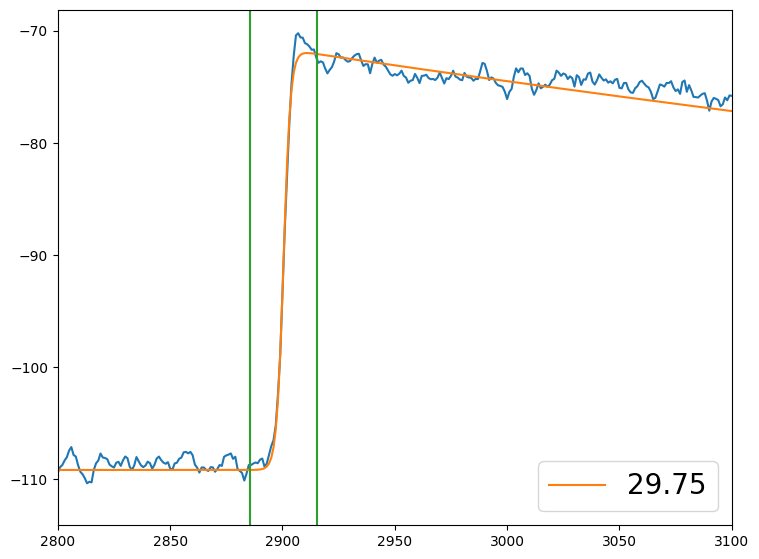

In [50]:
nrows,ncols=40,4
py.figure(figsize=(10*ncols,8*nrows))

ax=py.subplot(nrows,ncols,1)
ax.plot(np.concatenate((before,after))/num)
# ax.set_xlim(2850,2950)
av_waves2 = np.concatenate((before,after))/num
func2, par1,chi2 = wave_fit(av_waves2,wave_func,p0=[-5,5e-7,1e-10,20,3500,1])
rise, vals = risetime(av_waves2, par1[4],low=0.1, high=0.9)
ax.plot(func2,label = '%.2f'%rise)
ax.legend(fontsize=20)
ax.set_xlim(2800,3100)
ax.axvline(par1[4]+15,color = 'C2')
ax.axvline(par1[4]-15,color = 'C2')
plt.show()

67811
8205
4580


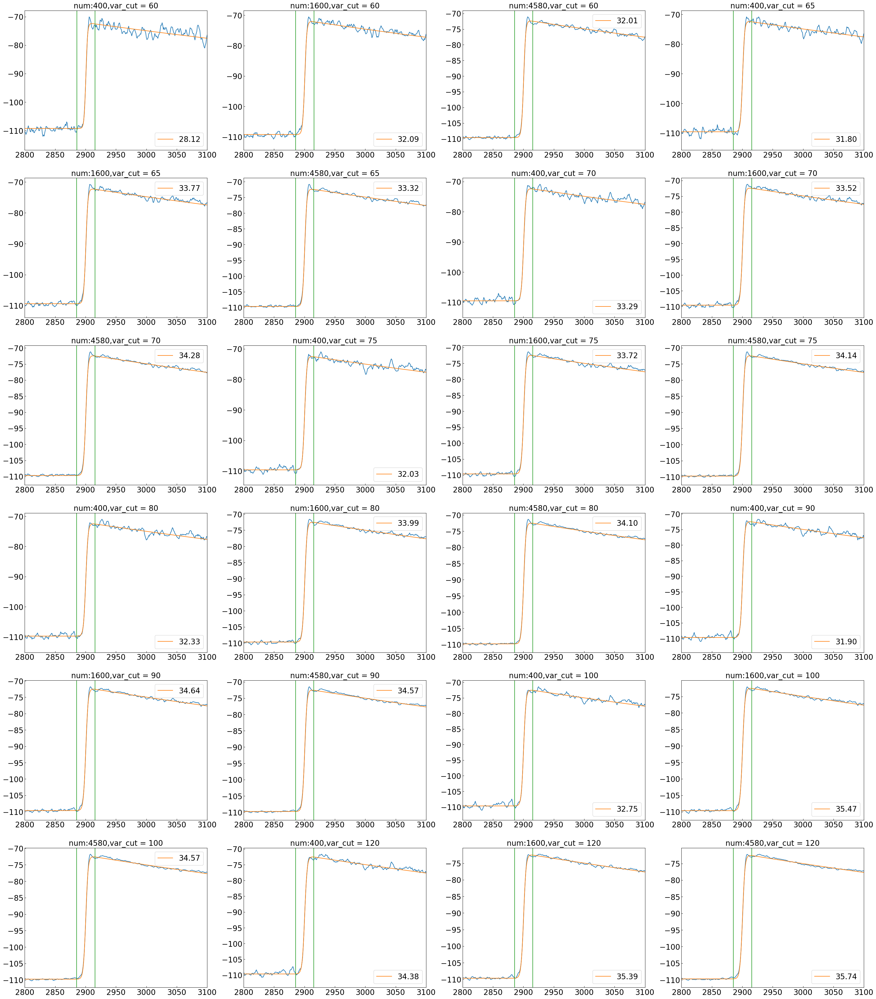

CPU times: user 34min 13s, sys: 39.9 s, total: 34min 53s
Wall time: 35min 8s


In [10]:
%%time

run.singleWaves().resetCuts()
print(len(run.singleWaves().waves()))
run.singleWaves().defineCut('pixel', '=', 76)

results.resetCuts()
print(len(run.singleWaves().waves()))

results.defineCut('energy', 'between',35,40)
cut = results.returnCut()
run.singleWaves().defineCut('custom', cut)
waves = run.singleWaves().waves()
print(len(waves))

# results.defineCut('t0', 'between',3475,3550)
# cut = results.returnCut()
# run.singleWaves().defineCut('custom', cut)
# waves = run.singleWaves().waves()
# print(len(waves))


nrows,ncols=40,4
py.figure(figsize=(10*ncols,8*nrows))

# before = 0
# after = 0
# num = 0

vars_par_list = [60,65,70,75,80,90,100,120]
# vars_par_list = [70]
vars_list = ['var2','var3','var4','var5']
# num_list = [100,400]
num_list = [400,1600,4580]
cnt = 0
rise_list_var3 = {}
av_waves_var3 = {}
func_var3 = {}
par_var3 = {}
num_waves3 = {}

for k in vars_par_list:
    rise_list_var3['%d'%k] = {}
    av_waves_var3['%d'%k] = {}
    func_var3['%d'%k] = {}
    par_var3['%d'%k] = {}
    num_waves3['%d'%k] = {}
    for j in range(len(num_list)):
        cnt += 1
        before = 0
        after = 0
        num = 0
        for i in range(num_list[j]):
            ydata = waves[i]
            func, par, chi2 = wave_fit(waves[i],wave_func,p0=[5,5e-3,1e-7,50,3500,0.7])

#             var1 = sum((ydata[:1500].compute() - np.mean(ydata[:1500].compute()))**2)/len(ydata[:1500].compute())
#             var6 = sum((ydata[3825:].compute() - np.mean(ydata[3825:].compute()))**2)/len(ydata[3825:].compute())

#             var7 = sum((ydata[4200:4400].compute() - np.mean(ydata[4200:4400].compute()))**2)/len(ydata[4200:4400].compute())
#             var8 = sum((ydata[3825:4025].compute() - np.mean(ydata[3825:4025].compute()))**2)/len(ydata[3825:4025].compute())
#             var9 = sum((ydata[5000:5200].compute() - np.mean(ydata[5000:5200].compute()))**2)/len(ydata[5000:5200].compute())

#             var10 = sum((ydata[1500:2500].compute() - np.mean(ydata[1500:2500].compute()))**2)/len(ydata[1500:2500].compute())
#             var11 = sum((ydata[2000:3400].compute() - np.mean(ydata[2000:3400].compute()))**2)/len(ydata[2000:3400].compute())
#             var12 = sum((ydata[500:700].compute() - np.mean(ydata[500:700].compute()))**2)/len(ydata[500:700].compute())


            if type(par)==int:
                pass

            elif (np.abs(par[5])/par[5] != np.abs(par[3])/par[3]):
                pass

            elif np.abs(par[5])/par[5] == np.abs(par[3])/par[3]:
#                 var2 = sum((ydata[int(par[4])+7:int(par[4])+200].compute() - np.mean(ydata[int(par[4])+7:int(par[4])+200].compute()))**2)/len(ydata[int(par[4])+7:int(par[4])+200].compute())
                var3 = sum((ydata[int(par[4])-200:int(par[4])-7].compute() - np.mean(ydata[int(par[4])-200:int(par[4])-7].compute()))**2)/len(ydata[int(par[4])-200:int(par[4])-7].compute())
#                 var4 = sum((ydata[int(par[4])-1000:int(par[4])-100].compute() - np.mean(ydata[int(par[4])-1000:int(par[4])-100].compute()))**2)/len(ydata[int(par[4])-1000:int(par[4])-100].compute())
#                 var5 = sum((ydata[int(par[4])+100:int(par[4])+1000].compute() - np.mean(ydata[int(par[4])+100:int(par[4])+1000].compute()))**2)/len(ydata[int(par[4])+100:int(par[4])+1000].compute())
                
#                 vars_list = [var2,var3,var4,var5]
                if np.abs(var3)<k:
#                     np.abs(var3)<75 and np.abs(var2)<75 and np.abs(var4)<110 and np.abs(var5)<130
                    num +=1
                    start = int(par[4])-2900
                    end = int(par[4]) + 3000

                    before += waves[i][start:int(par[4])].compute()
                    after += waves[i][int(par[4]):end].compute()

                else:
                    pass


        ax=py.subplot(nrows,ncols,cnt)
        ax.tick_params(direction='in',which='both',axis='both',labelsize=20)

        av_waves = np.concatenate((before,after))/num
        ax.plot(av_waves)
        func, par, chi2 = wave_fit(av_waves, wave_func, p0=[5,5e-3,1e-7,50,3500,0.7])
        rise, vals = risetime(av_waves, par[4],low=0.1, high=0.9)

        rise_list_var3['%d'%k]['%d'%num_list[j]] = rise
        av_waves_var3['%d'%k]['%d'%num_list[j]] = av_waves
        func_var3['%d'%k]['%d'%num_list[j]] = func
        par_var3['%d'%k]['%d'%num_list[j]] = par
        num_waves3['%d'%k]['%d'%num_list[j]] = num
        
        ax.set_title('num:%d,var_cut = %d'%(num_list[j],k),fontsize=20)
        ax.plot(func,label = '%.2f'%rise)
        ax.axvline(par[4]+15,color = 'C2')
        ax.axvline(par[4]-15,color = 'C2')
        ax.legend(fontsize=20)
        ax.set_xlim(2800,3100)

plt.show()

67811
8205
4580


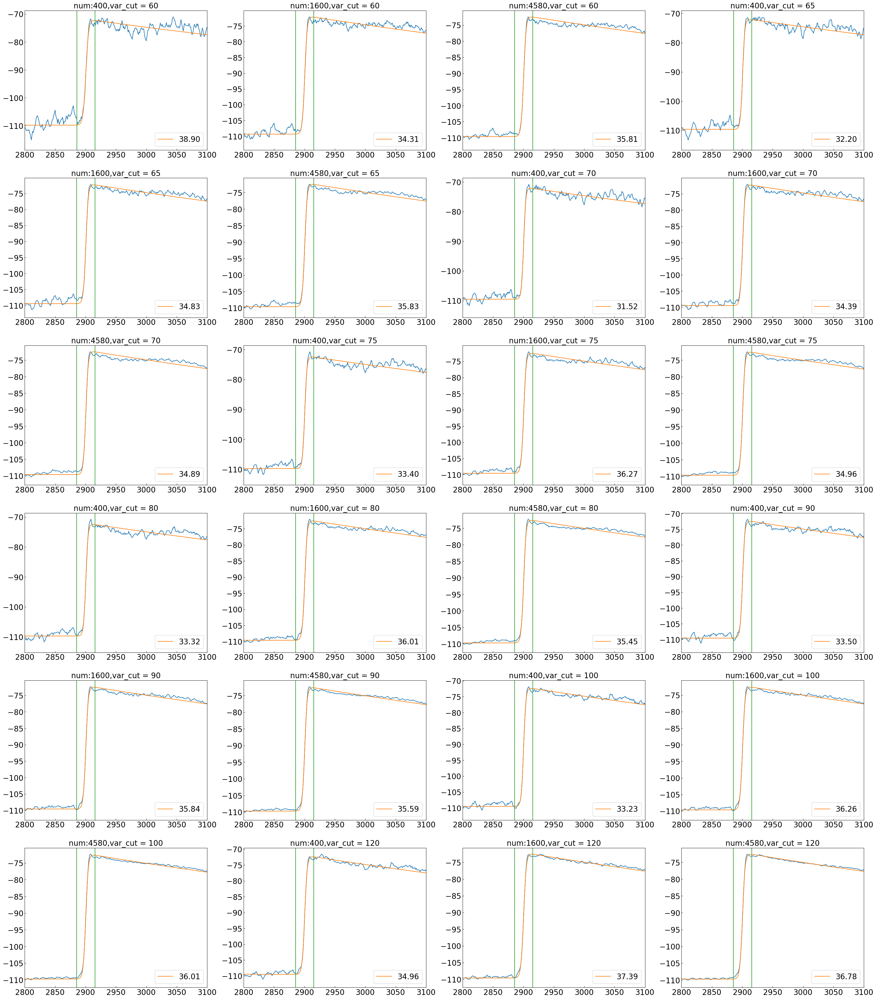

CPU times: user 34min 11s, sys: 40.6 s, total: 34min 52s
Wall time: 35min 7s


In [46]:
%%time

run.singleWaves().resetCuts()
print(len(run.singleWaves().waves()))
run.singleWaves().defineCut('pixel', '=', 76)

results.resetCuts()
print(len(run.singleWaves().waves()))

results.defineCut('energy', 'between',35,40)
cut = results.returnCut()
run.singleWaves().defineCut('custom', cut)
waves = run.singleWaves().waves()
print(len(waves))

# results.defineCut('t0', 'between',3475,3550)
# cut = results.returnCut()
# run.singleWaves().defineCut('custom', cut)
# waves = run.singleWaves().waves()
# print(len(waves))


nrows,ncols=40,4
py.figure(figsize=(10*ncols,8*nrows))

# before = 0
# after = 0
# num = 0

vars_par_list = [60,65,70,75,80,90,100,120]
# vars_par_list = [70]
vars_list = ['var2','var3','var4','var5']
# num_list = [100,400]
num_list = [400,1600,4580]
cnt = 0
rise_list_var2 = {}
av_waves_var2 = {}
func_var2 = {}
par_var2 = {}
num_waves2 = {}

for k in vars_par_list:
    rise_list_var2['%d'%k] = {}
    av_waves_var2['%d'%k] = {}
    func_var2['%d'%k] = {}
    par_var2['%d'%k] = {}
    num_waves2['%d'%k] = {}
    for j in range(len(num_list)):
        cnt += 1
        before = 0
        after = 0
        num = 0
        for i in range(num_list[j]):
            ydata = waves[i]
            func, par, chi2 = wave_fit(waves[i],wave_func,p0=[5,5e-3,1e-7,50,3500,0.7])

#             var1 = sum((ydata[:1500].compute() - np.mean(ydata[:1500].compute()))**2)/len(ydata[:1500].compute())
#             var6 = sum((ydata[3825:].compute() - np.mean(ydata[3825:].compute()))**2)/len(ydata[3825:].compute())

#             var7 = sum((ydata[4200:4400].compute() - np.mean(ydata[4200:4400].compute()))**2)/len(ydata[4200:4400].compute())
#             var8 = sum((ydata[3825:4025].compute() - np.mean(ydata[3825:4025].compute()))**2)/len(ydata[3825:4025].compute())
#             var9 = sum((ydata[5000:5200].compute() - np.mean(ydata[5000:5200].compute()))**2)/len(ydata[5000:5200].compute())

#             var10 = sum((ydata[1500:2500].compute() - np.mean(ydata[1500:2500].compute()))**2)/len(ydata[1500:2500].compute())
#             var11 = sum((ydata[2000:3400].compute() - np.mean(ydata[2000:3400].compute()))**2)/len(ydata[2000:3400].compute())
#             var12 = sum((ydata[500:700].compute() - np.mean(ydata[500:700].compute()))**2)/len(ydata[500:700].compute())


            if type(par)==int:
                pass

            elif (np.abs(par[5])/par[5] != np.abs(par[3])/par[3]):
                pass

            elif np.abs(par[5])/par[5] == np.abs(par[3])/par[3]:
                var2 = sum((ydata[int(par[4])+7:int(par[4])+200].compute() - np.mean(ydata[int(par[4])+7:int(par[4])+200].compute()))**2)/len(ydata[int(par[4])+7:int(par[4])+200].compute())
#                 var3 = sum((ydata[int(par[4])-200:int(par[4])-7].compute() - np.mean(ydata[int(par[4])-200:int(par[4])-7].compute()))**2)/len(ydata[int(par[4])-200:int(par[4])-7].compute())
#                 var4 = sum((ydata[int(par[4])-1000:int(par[4])-100].compute() - np.mean(ydata[int(par[4])-1000:int(par[4])-100].compute()))**2)/len(ydata[int(par[4])-1000:int(par[4])-100].compute())
#                 var5 = sum((ydata[int(par[4])+100:int(par[4])+1000].compute() - np.mean(ydata[int(par[4])+100:int(par[4])+1000].compute()))**2)/len(ydata[int(par[4])+100:int(par[4])+1000].compute())
                
#                 vars_list = [var2,var3,var4,var5]
                if np.abs(var2)<k:
#                     np.abs(var3)<75 and np.abs(var2)<75 and np.abs(var4)<110 and np.abs(var5)<130
                    num +=1
                    start = int(par[4])-2900
                    end = int(par[4]) + 3000

                    before += waves[i][start:int(par[4])].compute()
                    after += waves[i][int(par[4]):end].compute()

                else:
                    pass


        ax=py.subplot(nrows,ncols,cnt)
        ax.tick_params(direction='in',which='both',axis='both',labelsize=20)

        av_waves = np.concatenate((before,after))/num
        ax.plot(av_waves)
        func, par, chi2 = wave_fit(av_waves, wave_func, p0=[5,5e-3,1e-7,50,3500,0.7])
        rise, vals = risetime(av_waves, par[4],low=0.1, high=0.9)

        rise_list_var2['%d'%k]['%d'%num_list[j]] = rise
        av_waves_var2['%d'%k]['%d'%num_list[j]] = av_waves
        func_var2['%d'%k]['%d'%num_list[j]] = func
        par_var2['%d'%k]['%d'%num_list[j]] = par
        num_waves2['%d'%k]['%d'%num_list[j]] = num
        
        ax.set_title('num:%d,var_cut = %d'%(num_list[j],k),fontsize=20)
        ax.plot(func,label = '%.2f'%rise)
        ax.axvline(par[4]+15,color = 'C2')
        ax.axvline(par[4]-15,color = 'C2')
        ax.legend(fontsize=20)
        ax.set_xlim(2800,3100)

plt.show()

In [12]:
import matplotlib as mpl
from matplotlib.colors import LinearSegmentedColormap

colors = ["yellow", "green", "blue"]
cmap = LinearSegmentedColormap.from_list("CustomCmap", colors)

from matplotlib.colors import ListedColormap

# colors = ["blue", "green", "yellow", "orange",]
# cmap = ListedColormap(colors)

In [55]:
df9 = pd.DataFrame(rise_list_var3)
df9

,60,65,70,75,80,85,90,95,100,110,120
100,24.894741,31.283492,32.358119,33.022165,33.333108,33.485720,33.507045,33.697000,33.888030,34.029964,34.230049
400,27.432232,31.319707,32.396879,32.975947,33.308305,33.446165,33.489495,33.686545,33.878225,34.028714,34.230476
800,27.916914,31.493725,32.407398,32.971166,33.301977,33.412125,33.493315,33.699571,33.885175,34.037570,34.236583
1600,29.551211,31.859513,32.504861,33.036982,33.348596,33.426846,33.544229,33.759266,33.930906,34.075339,34.260062
3200,30.618402,32.035368,32.698719,33.169456,33.390810,33.442012,33.589622,33.813258,33.976160,34.134058,34.306585
4580,31.298888,32.362623,33.049032,33.342508,33.497289,33.508937,33.696112,33.889663,34.027118,34.226269,34.381424


In [13]:
df10 = pd.DataFrame(rise_list_var3)
df10

,60,65,70,75,80,90,100,120
400,28.119837,31.795461,33.294706,32.028056,32.334912,31.899800,32.748518,34.378874
1600,32.087514,33.769376,33.521522,33.719971,33.992134,34.636160,35.465850,35.394151
4580,32.006746,33.319099,34.280798,34.142283,34.102992,34.571443,34.573710,35.744056


In [47]:
df11 = pd.DataFrame(rise_list_var2)
df11

,60,65,70,75,80,90,100,120
400,38.899579,32.200020,31.517744,33.399482,33.315655,33.498325,33.231270,34.958891
1600,34.313433,34.827327,34.390510,36.269485,36.009982,35.843122,36.257578,37.385115
4580,35.805526,35.826662,34.893357,34.960675,35.448138,35.594834,36.005614,36.780215


In [48]:
y2 = pd.DataFrame(num_waves2)
y3 = pd.DataFrame(num_waves3)
y2

,60,65,70,75,80,90,100,120
400,35,61,84,127,152,209,256,318
1600,118,206,312,436,550,791,977,1231
4580,320,567,876,1213,1572,2236,2799,3508


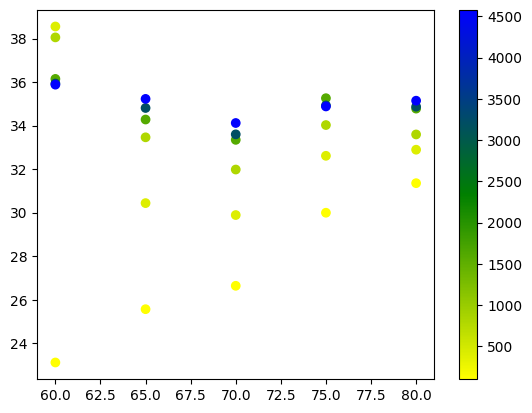

In [36]:
# viridis = mpl.colormaps['viridis'].resampled(4)
# y = num_list
# x = vars_par_list
# plt.scatter([num_list[0]]*len(x),df['100'],c=x,cmap=cmap)
# plt.scatter([num_list[1]]*len(x),df['400'],c=x,cmap=cmap)
# plt.scatter([num_list[2]]*len(x),df['800'],c=x,cmap=cmap)
# plt.scatter([num_list[3]]*len(x),df['1200'],c=x,cmap=cmap)

# plt.colorbar()
# plt.show()

y = num_list
x = vars_par_list
plt.scatter([60]*len(y),df['60'],c=y,cmap=cmap)
plt.scatter([65]*len(y),df2['65'],c=y,cmap=cmap)
plt.scatter([70]*len(y),df3['70'],c=y,cmap=cmap)
plt.scatter([75]*len(y),df4['75'],c=y,cmap=cmap)
plt.scatter([80]*len(y),df5['80'],c=y,cmap=cmap)
# plt.scatter([x[1]]*len(y),df['65'],c=y,cmap=cmap)
# plt.scatter([x[2]]*len(y),df['70'],c=y,cmap=cmap)

plt.colorbar()
plt.show()

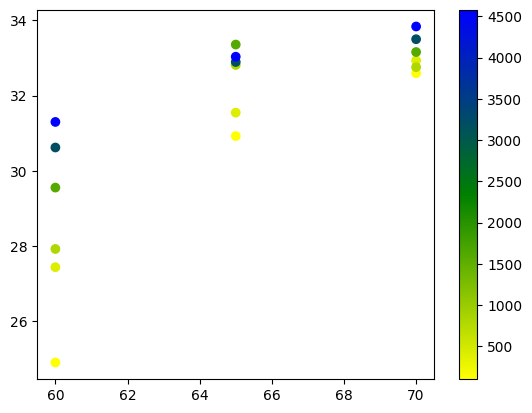

In [47]:
y = num_list
x = vars_par_list
plt.scatter([60]*len(y),df6['60'],c=y,cmap=cmap)
plt.scatter([65]*len(y),df7['65'],c=y,cmap=cmap)
plt.scatter([70]*len(y),df8['70'],c=y,cmap=cmap)
# plt.scatter([75]*len(y),df4['75'],c=y,cmap=cmap)
# plt.scatter([80]*len(y),df5['80'],c=y,cmap=cmap)
# plt.scatter([x[1]]*len(y),df['65'],c=y,cmap=cmap)
# plt.scatter([x[2]]*len(y),df['70'],c=y,cmap=cmap)

plt.colorbar()
plt.show()

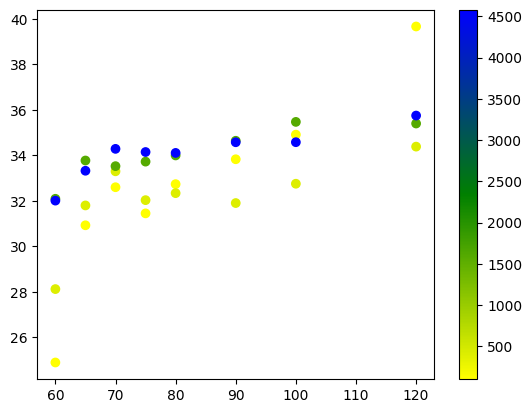

In [29]:
y = num_list
x = vars_par_list

# vars_par_list = [60,65,70,75,80,90,100,120]
plt.scatter([60]*len(y),df10['60'],c=y,cmap=cmap)
plt.scatter([65]*len(y),df10['65'],c=y,cmap=cmap)
plt.scatter([70]*len(y),df10['70'],c=y,cmap=cmap)
plt.scatter([75]*len(y),df10['75'],c=y,cmap=cmap)
plt.scatter([80]*len(y),df10['80'],c=y,cmap=cmap)
# plt.scatter([85]*len(y),df10['85'],c=y,cmap=cmap)
plt.scatter([90]*len(y),df10['90'],c=y,cmap=cmap)
# plt.scatter([95]*len(y),df10['95'],c=y,cmap=cmap)
plt.scatter([100]*len(y),df10['100'],c=y,cmap=cmap)
# plt.scatter([110]*len(y),df10['110'],c=y,cmap=cmap)
plt.scatter([120]*len(y),df10['120'],c=y,cmap=cmap)
plt.colorbar()
plt.show()

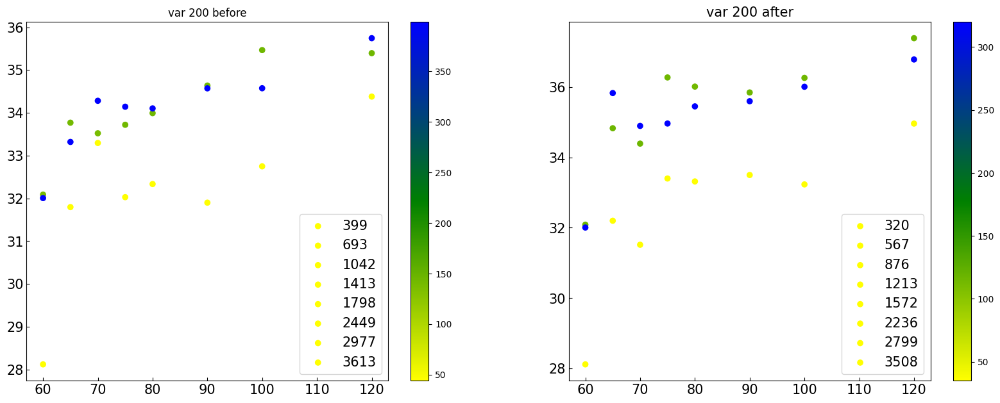

In [49]:
nrows,ncols=2,2
py.figure(figsize=(10*ncols,8*nrows))

x = vars_par_list

ax=py.subplot(nrows,ncols,1)
ax.tick_params(direction='in',which='both',axis='both',labelsize=15)

im = ax.scatter([60]*len(y3),df10['60'],c=y3['60'],cmap=cmap,label = '%d'%y3['60']['4580'])
ax.scatter([65]*len(y3),df10['65'],c=y3['65'],cmap=cmap,label = '%d'%y3['65']['4580'])
ax.scatter([70]*len(y3),df10['70'],c=y3['70'],cmap=cmap,label = '%d'%y3['70']['4580'])
ax.scatter([75]*len(y3),df10['75'],c=y3['75'],cmap=cmap,label = '%d'%y3['75']['4580'])
ax.scatter([80]*len(y3),df10['80'],c=y3['80'],cmap=cmap,label = '%d'%y3['80']['4580'])
ax.scatter([90]*len(y3),df10['90'],c=y3['90'],cmap=cmap,label = '%d'%y3['90']['4580'])
ax.scatter([100]*len(y3),df10['100'],c=y3['100'],cmap=cmap,label = '%d'%y3['100']['4580'])
ax.scatter([120]*len(y3),df10['120'],c=y3['120'],cmap=cmap,label = '%d'%y3['120']['4580'])
ax.legend(fontsize=15)


plt.colorbar(im)
ax.set_title('var 200 before')

ax=py.subplot(nrows,ncols,2)
ax.tick_params(direction='in',which='both',axis='both',labelsize=15)

im = ax.scatter([60]*len(y2),df10['60'],c=y2['60'],cmap=cmap,label = '%d'%y2['60']['4580'])
ax.scatter([65]*len(y2),df11['65'],c=y2['65'],cmap=cmap,label = '%d'%y2['65']['4580'])
ax.scatter([70]*len(y2),df11['70'],c=y2['70'],cmap=cmap,label = '%d'%y2['70']['4580'])
ax.scatter([75]*len(y2),df11['75'],c=y2['75'],cmap=cmap,label = '%d'%y2['75']['4580'])
ax.scatter([80]*len(y2),df11['80'],c=y2['80'],cmap=cmap,label = '%d'%y2['80']['4580'])
ax.scatter([90]*len(y2),df11['90'],c=y2['90'],cmap=cmap,label = '%d'%y2['90']['4580'])
ax.scatter([100]*len(y2),df11['100'],c=y2['100'],cmap=cmap,label = '%d'%y2['100']['4580'])
ax.scatter([120]*len(y2),df11['120'],c=y2['120'],cmap=cmap,label = '%d'%y2['120']['4580'])

plt.colorbar(im)
ax.set_title('var 200 after',fontsize=15)
ax.legend(fontsize=15)

plt.show()

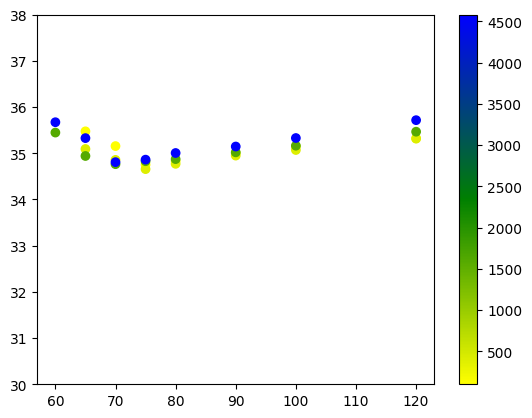

In [32]:
y = num_list
x = vars_par_list

# vars_par_list = [60,65,70,75,80,90,100,120]
plt.scatter([60]*len(y),df11['60'],c=y,cmap=cmap)
plt.scatter([65]*len(y),df11['65'],c=y,cmap=cmap)
plt.scatter([70]*len(y),df11['70'],c=y,cmap=cmap)
plt.scatter([75]*len(y),df11['75'],c=y,cmap=cmap)
plt.scatter([80]*len(y),df11['80'],c=y,cmap=cmap)
# plt.scatter([85]*len(y),df10['85'],c=y,cmap=cmap)
plt.scatter([90]*len(y),df11['90'],c=y,cmap=cmap)
# plt.scatter([95]*len(y),df10['95'],c=y,cmap=cmap)
plt.scatter([100]*len(y),df11['100'],c=y,cmap=cmap)
# plt.scatter([110]*len(y),df10['110'],c=y,cmap=cmap)
plt.scatter([120]*len(y),df11['120'],c=y,cmap=cmap)
plt.ylim(30,38)
plt.colorbar()
plt.show()

In [ ]:
%%time

run.singleWaves().resetCuts()
print(len(run.singleWaves().waves()))
run.singleWaves().defineCut('pixel', '=', 76)

results.resetCuts()
print(len(run.singleWaves().waves()))

results.defineCut('energy', 'between',35,40)
cut = results.returnCut()
run.singleWaves().defineCut('custom', cut)
waves = run.singleWaves().waves()
print(len(waves))

# results.defineCut('t0', 'between',3475,3550)
# cut = results.returnCut()
# run.singleWaves().defineCut('custom', cut)
# waves = run.singleWaves().waves()
# print(len(waves))


nrows,ncols=40,4
py.figure(figsize=(10*ncols,8*nrows))

before = 0
after = 0
num = 0

vars_par_list = [60,65,70,75,80,85,90,95,100,110,120]
# vars_par_list = [70]
vars_list = ['var2','var3','var4','var5']
# num_list = [100,400]
num_list = [100,400,800,1600,3200,4580]
cnt = 0
rise_list_var2 = {}

for k in vars_par_list:
    rise_list_var2['%d'%k] = {}
    for j in range(len(num_list)):
        cnt += 1
        for i in range(num_list[j]):
            ydata = waves[i]
            func, par, chi2 = wave_fit(waves[i],wave_func,p0=[5,5e-3,1e-7,50,3500,0.7])

#             var1 = sum((ydata[:1500].compute() - np.mean(ydata[:1500].compute()))**2)/len(ydata[:1500].compute())
#             var6 = sum((ydata[3825:].compute() - np.mean(ydata[3825:].compute()))**2)/len(ydata[3825:].compute())

#             var7 = sum((ydata[4200:4400].compute() - np.mean(ydata[4200:4400].compute()))**2)/len(ydata[4200:4400].compute())
#             var8 = sum((ydata[3825:4025].compute() - np.mean(ydata[3825:4025].compute()))**2)/len(ydata[3825:4025].compute())
#             var9 = sum((ydata[5000:5200].compute() - np.mean(ydata[5000:5200].compute()))**2)/len(ydata[5000:5200].compute())

#             var10 = sum((ydata[1500:2500].compute() - np.mean(ydata[1500:2500].compute()))**2)/len(ydata[1500:2500].compute())
#             var11 = sum((ydata[2000:3400].compute() - np.mean(ydata[2000:3400].compute()))**2)/len(ydata[2000:3400].compute())
#             var12 = sum((ydata[500:700].compute() - np.mean(ydata[500:700].compute()))**2)/len(ydata[500:700].compute())


            if type(par)==int:
                pass

            elif (np.abs(par[5])/par[5] != np.abs(par[3])/par[3]):
                pass

            elif np.abs(par[5])/par[5] == np.abs(par[3])/par[3]:
                var2 = sum((ydata[int(par[4])+7:int(par[4])+200].compute() - np.mean(ydata[int(par[4])+7:int(par[4])+200].compute()))**2)/len(ydata[int(par[4])+7:int(par[4])+200].compute())
#                 var3 = sum((ydata[int(par[4])-200:int(par[4])-7].compute() - np.mean(ydata[int(par[4])-200:int(par[4])-7].compute()))**2)/len(ydata[int(par[4])-200:int(par[4])-7].compute())
#                 var4 = sum((ydata[int(par[4])-1000:int(par[4])-100].compute() - np.mean(ydata[int(par[4])-1000:int(par[4])-100].compute()))**2)/len(ydata[int(par[4])-1000:int(par[4])-100].compute())
#                 var5 = sum((ydata[int(par[4])+100:int(par[4])+1000].compute() - np.mean(ydata[int(par[4])+100:int(par[4])+1000].compute()))**2)/len(ydata[int(par[4])+100:int(par[4])+1000].compute())
                
#                 vars_list = [var2,var3,var4,var5]
                if np.abs(var3)<k:
#                     np.abs(var3)<75 and np.abs(var2)<75 and np.abs(var4)<110 and np.abs(var5)<130
                    num +=1
                    start = int(par[4])-2900
                    end = int(par[4]) + 3000

                    before += waves[i][start:int(par[4])].compute()
                    after += waves[i][int(par[4]):end].compute()

                else:
                    pass


        ax=py.subplot(nrows,ncols,cnt)
        ax.tick_params(direction='in',which='both',axis='both',labelsize=20)

        av_waves = np.concatenate((before,after))/num
        ax.plot(av_waves)
        func, par, chi2 = wave_fit(av_waves, wave_func, p0=[5,5e-3,1e-7,50,3500,0.7])
        rise, vals = risetime(av_waves, par[4],low=0.1, high=0.9)

        rise_list_var2['%d'%k]['%d'%num_list[j]] = rise
        ax.set_title('num:%d,var_cut = %d'%(num_list[j],k),fontsize=20)
        ax.plot(func,label = '%.2f'%rise)
        ax.axvline(par[4]+15,color = 'C2')
        ax.axvline(par[4]-15,color = 'C2')
        ax.legend(fontsize=20)
        ax.set_xlim(2800,3100)

plt.show()

In [16]:
func2, par2,chi2 = wave_fit(av_waves2,wave_func,p0=[-5,5e-7,1e-10,20,3500,1])
func1, par1,chi2 = wave_fit(av_waves1,wave_func,p0=[-5,5e-7,1e-10,20,3500,1])

In [58]:
[num_list[0]]*2

[100, 100]

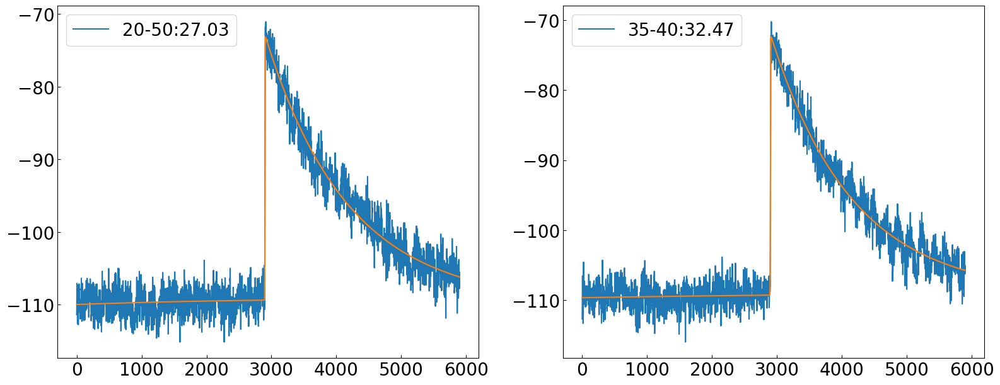

In [33]:
nrows,ncols=2,5
py.figure(figsize=(10*ncols,8*nrows))

ax=py.subplot(nrows,ncols,1)
ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
rise, vals = risetime(av_waves1, par1[4],low=0.1, high=0.9)
ax.plot(av_waves1,label = '20-50:%.2f'%rise)
ax.plot(func1)

ax.legend(fontsize = 20,loc = 'upper left')

ax=py.subplot(nrows,ncols,2)
ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
rise, vals = risetime(av_waves2,par2[4],low=0.1, high=0.9)
ax.plot(av_waves2,label = '35-40:%.2f'%rise)
ax.plot(func2)
ax.legend(fontsize = 20,loc = 'upper left')


plt.show()

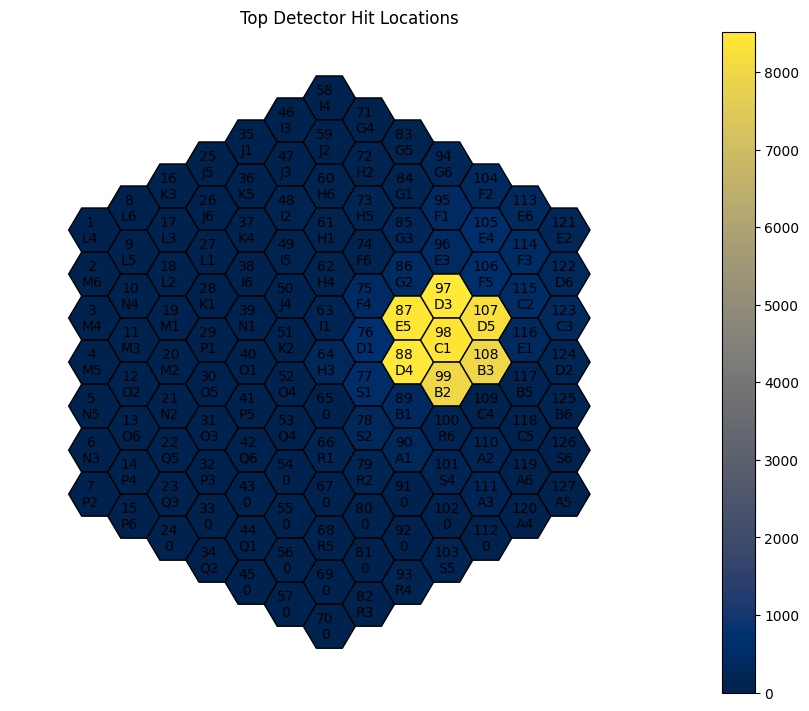

In [31]:
runNumber = 1829
directory = '/storage/home/hcoda1/4/ashelby8/scratch/ManitobaData/03-16-2022_30KeV_Proton_Bias_Scan_Cd109/-320V/'
run = Nab.DataRun(directory, runNumber, ignoreEventFile = False)
run.plotHitLocations(sourceFile = 'singles',plot = True,det = 'top')

In [ ]:
run.singleWaves().resetCuts()
print(len(run.singleWaves().waves()))
run.singleWaves().defineCut('pixel', '=', 98)
print(len(run.singleWaves().waves()))
results = run.singleWaves().determineEnergyTiming(method='trap', params=[1250, 50, 1250])
results.resetCuts()
results.defineCut('energy', 'between',20,50)
cut = results.returnCut()
run.singleWaves().defineCut('custom', cut)
waves = run.singleWaves().waves()

print(len(waves))
nrows,ncols=11,5
py.figure(figsize=(10*ncols,8*nrows))
cnt = 2

before = 0
after = 0
num = 0
for i in range(50):
    func, par, chi2 = wave_fit(waves[i],wave_func,p0=[-5,5e-7,1e-10,-50,3500,10])
#     print(chi2)
    if i<50:
        cnt+=1
        ax=py.subplot(nrows,ncols,cnt)
        ax.plot(waves[i])
        ax.plot(func,label = '%.2f:%d'%(chi2,i))
        ax.set_xlim(3200,4000)
        ax.legend()
#         print(par[4])
    if type(par)==int or par[4]>4500:
        pass
    elif np.abs(chi2)<1000:
#         print(i)
        num +=1
        start = int(par[4])-2900
        end = int(par[4]) + 3000
        before += waves[i][start:int(par[4])].compute()
        after += waves[i][int(par[4]):end].compute()
        if i%10==0:
            ax=py.subplot(nrows,ncols,1)
            ax.plot(np.concatenate((before,after))/num)
        

ax=py.subplot(nrows,ncols,2)
ax.plot(np.concatenate((before,after))/num)
av_waves3 = np.concatenate((before,after))/num
plt.show()

68757
8422
7807
Optimal parameters not found: Number of calls to function has reached maxfev = 1400.
Optimal parameters not found: Number of calls to function has reached maxfev = 1400.
Optimal parameters not found: Number of calls to function has reached maxfev = 1400.
Optimal parameters not found: Number of calls to function has reached maxfev = 1400.


68757
8422
4965


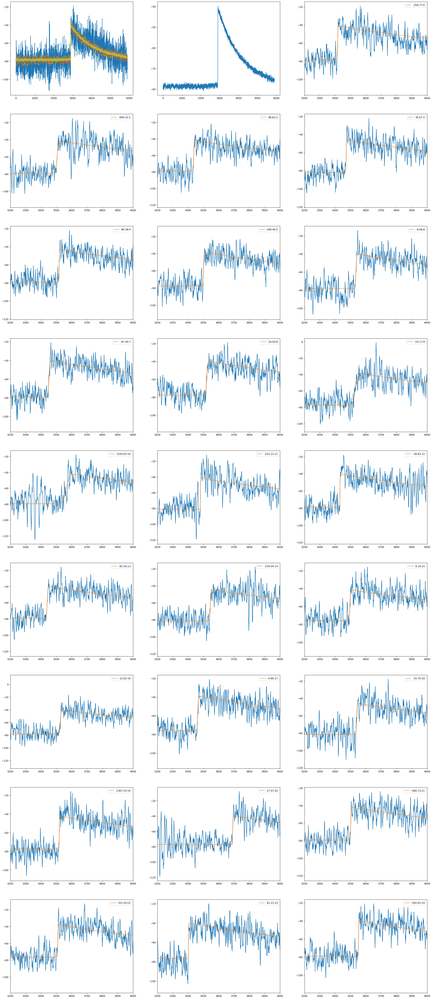

In [41]:
run.singleWaves().resetCuts()
print(len(run.singleWaves().waves()))
run.singleWaves().defineCut('pixel', '=', 98)

results.resetCuts()
print(len(run.singleWaves().waves()))

results.defineCut('energy', 'between',35,40)
cut = results.returnCut()
run.singleWaves().defineCut('custom', cut)
waves = run.singleWaves().waves()

print(len(waves))
nrows,ncols=11,3
py.figure(figsize=(10*ncols,8*nrows))
cnt = 2

before = 0
after = 0
num = 0
for i in range(200):
    func, par, chi2 = wave_fit(waves[i],wave_func,p0=[-5,5e-7,1e-10,-50,3500,10])
#     print(chi2)
    if i<25:
        cnt+=1
        ax=py.subplot(nrows,ncols,cnt)
        ax.plot(waves[i])
        ax.plot(func,label = '%.2f:%d'%(chi2,i))
        ax.set_xlim(3200,4000)
        ax.legend()
#         print(par[4])
    if type(par)==int or par[4]>4500:
        pass
    elif np.abs(chi2)<1000:
#         print(i)
        num +=1
        start = int(par[4])-2900
        end = int(par[4]) + 3000
        before += waves[i][start:int(par[4])].compute()
        after += waves[i][int(par[4]):end].compute()
        if i%10==0:
            ax=py.subplot(nrows,ncols,1)
            ax.plot(np.concatenate((before,after))/num)
        

ax=py.subplot(nrows,ncols,2)
ax.plot(np.concatenate((before,after))/num)
av_waves4 = np.concatenate((before,after))/num
plt.show()

In [35]:
func4, par4,chi24 = wave_fit(av_waves4,wave_func,p0=[-5,5e-7,1e-10,-20,3500,10])
func3, par3,chi23 = wave_fit(av_waves3,wave_func,p0=[-5,5e-7,1e-10,-20,3500,10])

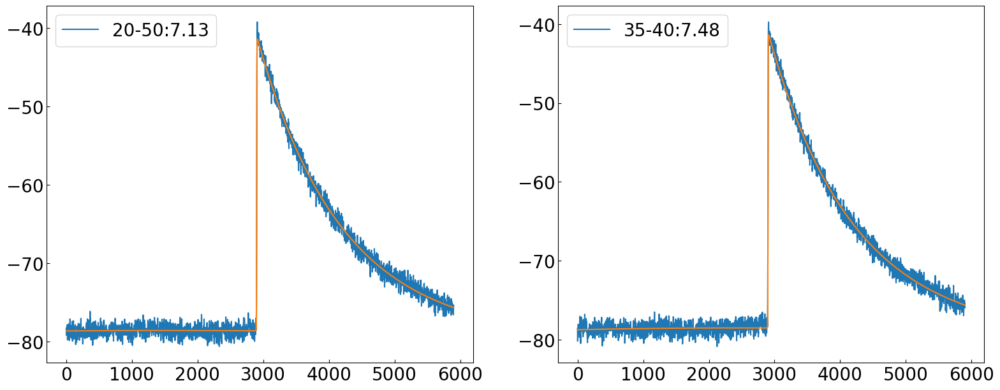

In [38]:
nrows,ncols=2,5
py.figure(figsize=(10*ncols,8*nrows))

ax=py.subplot(nrows,ncols,1)
ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
rise, vals = risetime(av_waves3,par3[4],low=0.1, high=0.9)
ax.plot(av_waves3,label = '20-50:%.2f'%rise)
ax.plot(func3)

ax.legend(fontsize = 20,loc = 'upper left')

ax=py.subplot(nrows,ncols,2)
ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
rise, vals = risetime(av_waves4,par4[4],low=0.1, high=0.9)
ax.plot(av_waves4,label = '35-40:%.2f'%rise)
ax.plot(func4)
ax.legend(fontsize = 20,loc = 'upper left')

plt.show()

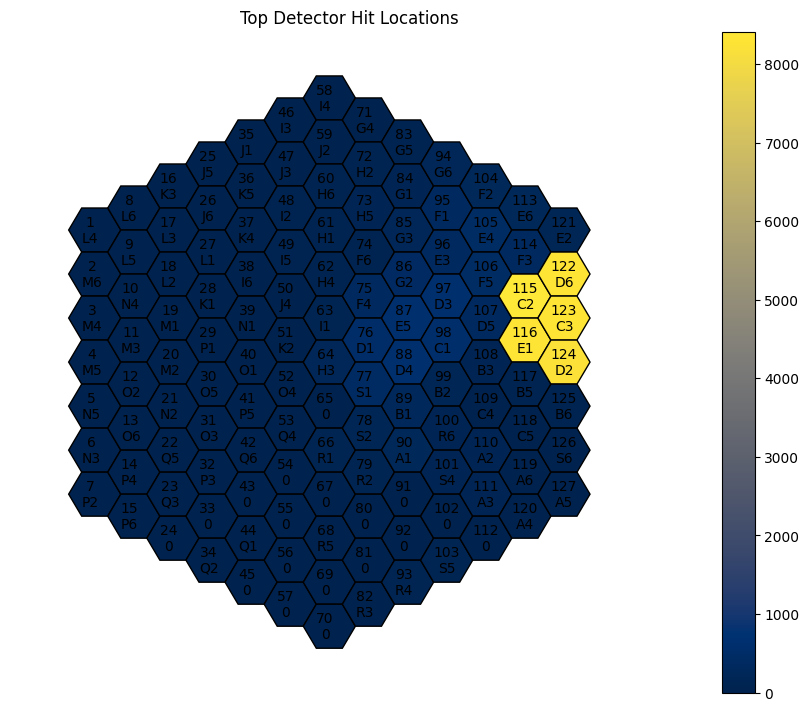

In [53]:
runNumber = 1830
directory = '/storage/home/hcoda1/4/ashelby8/scratch/ManitobaData/03-16-2022_30KeV_Proton_Bias_Scan_Cd109/-320V/'
run = Nab.DataRun(directory, runNumber, ignoreEventFile = False)
run.plotHitLocations(sourceFile = 'singles',plot = True,det = 'top')

52247
8313
8061


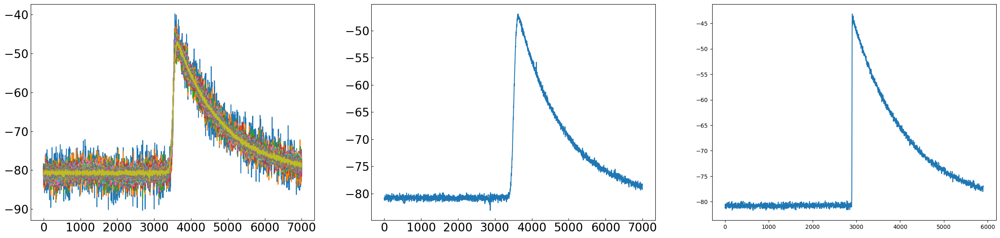

In [99]:
run.singleWaves().resetCuts()
print(len(run.singleWaves().waves()))
run.singleWaves().defineCut('pixel', '=', 123)
print(len(run.singleWaves().waves()))
results = run.singleWaves().determineEnergyTiming(method='trap', params=[1250, 50, 1250])
results.resetCuts()
results.defineCut('energy', 'between',20,50)
cut = results.returnCut()
run.singleWaves().defineCut('custom', cut)
waves = run.singleWaves().waves()

print(len(waves))
nrows,ncols=11,3
py.figure(figsize=(10*ncols,8*nrows))
cnt = 2

before = 0
after = 0
num = 0
for i in range(200):
    func, par, chi2 = wave_fit(waves[i],wave_func,p0=[-5,5e-7,1e-10,-50,3500,10])
#     print(chi2)
    if np.abs(chi2)>1000:
        cnt+=1
        ax=py.subplot(nrows,ncols,cnt)
        ax.plot(waves[i])
        ax.plot(func,label = '%.2f:%d'%(chi2,i))
        ax.set_xlim(3200,4000)
        ax.legend()
#         print(par[4])
    if type(par)==int or par[4]>4500:
        pass
    elif np.abs(chi2)<1000:
#         print(i)
        num +=1
        start = int(par[4])-2900
        end = int(par[4]) + 3000
        before += waves[i][start:int(par[4])].compute()
        after += waves[i][int(par[4]):end].compute()
        if i%10==0:
            ax=py.subplot(nrows,ncols,1)
            ax.plot(np.concatenate((before,after))/num)
        

ax=py.subplot(nrows,ncols,2)
ax.plot(np.concatenate((before,after))/num)
av_waves5 = np.concatenate((before,after))/num
plt.show()

52247
8313
5138


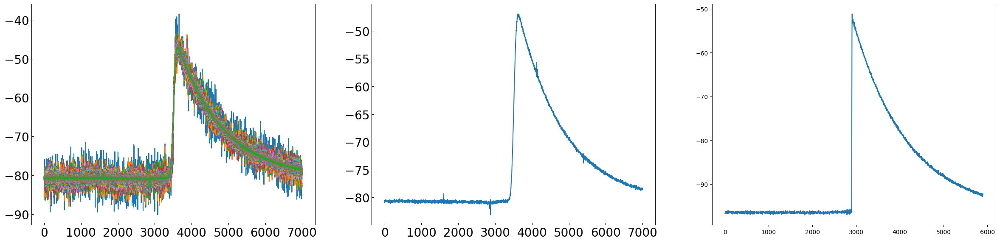

In [100]:
run.singleWaves().resetCuts()
print(len(run.singleWaves().waves()))
run.singleWaves().defineCut('pixel', '=', 123)

results.resetCuts()
print(len(run.singleWaves().waves()))

results.defineCut('energy', 'between',35,40)
cut = results.returnCut()
run.singleWaves().defineCut('custom', cut)
waves = run.singleWaves().waves()

print(len(waves))
nrows,ncols=10,5
py.figure(figsize=(10*ncols,8*nrows))
cnt = 1

summation = 0
for i in range(len(waves)):

    func,par = wave_fit(waves[i],wave_func,p0=[-5,5e-7,1e-10,-20,3500,10])
    if type(par)==int:
        pass
    else:
        start = int(par[4])-2900
        end = int(par[4]) + 3000
        before += waves[i][start:int(par[4])].compute()
        after += waves[i][int(par[4]):end].compute()
    
    summation += waves[i].compute()
    if i%10==0 and i!=0:
        ax=py.subplot(nrows,ncols,1)
        ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
        ax.plot(summation/(i+1))
#         ax.set_ylim(-120,-60)

        
ax=py.subplot(nrows,ncols,2)
ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
# ax.set_ylim(-120,-60)
ax.plot(summation/i)
av_waves2 = summation/i

ax=py.subplot(nrows,ncols,3)
ax.plot(np.concatenate((before,after))/i)
av_waves24 = np.concatenate((before,after))/i
plt.show()

In [101]:
func2, par2 = wave_fit(av_waves24,wave_func,p0=[-5,5e-7,1e-10,-20,3500,10])
func1, par1 = wave_fit(av_waves13,wave_func,p0=[-5,5e-7,1e-10,-20,3500,10])

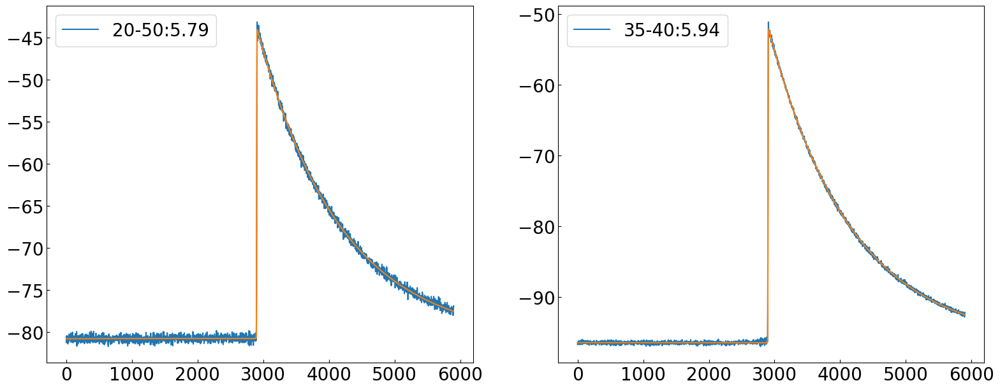

In [102]:
nrows,ncols=2,5
py.figure(figsize=(10*ncols,8*nrows))

ax=py.subplot(nrows,ncols,1)
ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
rise, vals = risetime(av_waves13,par1[4],low=0.1, high=0.9)
ax.plot(av_waves13,label = '20-50:%.2f'%rise)
ax.plot(func1)

ax.legend(fontsize = 20,loc = 'upper left')

ax=py.subplot(nrows,ncols,2)
ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
rise, vals = risetime(av_waves24,par2[4],low=0.1, high=0.9)
ax.plot(av_waves24,label = '35-40:%.2f'%rise)
ax.plot(func2)
ax.legend(fontsize = 20,loc = 'upper left')


plt.show()